In [88]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [89]:
df = pd.read_csv("force2020_data_unsupervised_learning.csv")
df.sample(10)



,RHOB,GR,DEPTH_MD,NPHI,PEF,DTC
2370,1.443552,30.063923,854.768,NaN,1.073048,135.576767
5907,1.899901,73.458488,1392.392,0.532840,2.706820,143.158844
7258,2.028736,74.762665,1597.744,0.470013,2.366246,148.283020
18007,2.515957,97.388023,3232.200,0.324087,NaN,83.552635
12221,1.910288,46.088482,2352.728,0.591391,6.574556,150.981338
14229,2.597888,37.759850,2657.944,0.126692,4.183851,76.631691
14020,2.482263,16.874498,2626.176,0.237313,5.386848,69.886391
15962,2.522476,104.628174,2921.360,0.310162,4.029961,86.579086
7284,2.052402,79.353592,1601.696,0.463617,2.500392,146.402512
5522,1.938320,83.390587,1333.872,0.484146,2.151599,145.227875


In [90]:
df.describe(percentiles=[.01, .05, .25, .5, .75, .95, .99]).T.round(3)


,count,mean,std,min,1%,5%,25%,50%,75%,95%,99%,max
RHOB,18270.0,2.110,0.298,1.405,1.415,1.463,1.963,2.055,2.382,2.567,2.611,2.928
GR,18270.0,63.847,28.636,6.192,10.206,14.662,43.867,66.778,81.543,101.287,114.217,499.023
DEPTH_MD,18270.0,1883.228,801.941,494.528,522.297,633.372,1188.750,1882.972,2577.802,3133.180,3244.255,3272.024
NPHI,14032.0,0.405,0.134,0.024,0.080,0.134,0.315,0.449,0.506,0.567,0.615,0.800
PEF,16440.0,3.464,2.561,1.010,1.045,1.077,2.321,2.790,4.267,6.889,11.209,66.030
DTC,18189.0,125.106,30.618,55.727,60.283,65.015,90.883,141.300,148.048,159.292,161.608,175.953


In [91]:
depth_step = df["DEPTH_MD"].diff().round(3)

print("Depth range:", df["DEPTH_MD"].min(), "to", df["DEPTH_MD"].max(), "m")
print("Depth always increasing:", df["DEPTH_MD"].is_monotonic_increasing)
print("Duplicate rows:", df.duplicated().sum())
print()
print("Step sizes between readings:")
print(depth_step.value_counts())
print()
print("Gaps larger than normal step:")
print(df.loc[depth_step > 0.152, ["DEPTH_MD"]].assign(step=depth_step[depth_step > 0.152]))


Depth range: 494.528 to 3272.024000000001 m
Depth always increasing: True
Duplicate rows: 0

Step sizes between readings:
DEPTH_MD
0.152    18268
0.760        1
Name: count, dtype: int64

Gaps larger than normal step:
       DEPTH_MD  step
10563  2100.712  0.76


          missing  percent
NPHI         4238    23.20
PEF          1830    10.02
DTC            81     0.44
RHOB            0     0.00
GR              0     0.00
DEPTH_MD        0     0.00

Rows with all curves present: 12202 of 18270


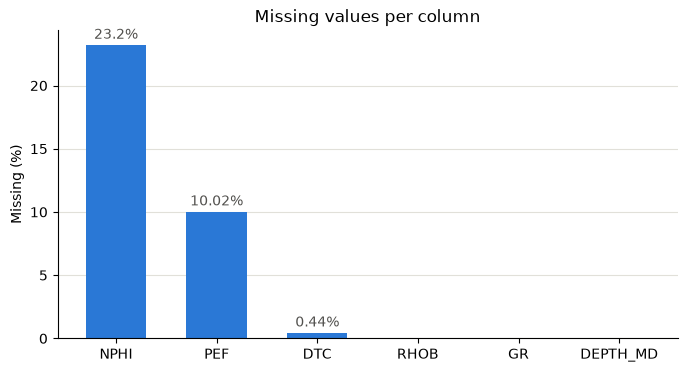

In [92]:
missing = df.isna().sum()
missing_pct = (missing / len(df) * 100).round(2)
missing_table = pd.DataFrame({"missing": missing, "percent": missing_pct}).sort_values("missing", ascending=False)

print(missing_table)
print()
print("Rows with all curves present:", df.dropna().shape[0], "of", len(df))

fig, ax = plt.subplots(figsize=(8, 4))
ax.bar(missing_table.index, missing_table["percent"], color="#2a78d6", width=0.6)
for i, v in enumerate(missing_table["percent"]):
    if v > 0:
        ax.text(i, v + 0.5, f"{v}%", ha="center", color="#52514e")
ax.set_title("Missing values per column")
ax.set_ylabel("Missing (%)")
ax.spines[["top", "right"]].set_visible(False)
ax.grid(axis="y", color="#e1e0d9")
ax.set_axisbelow(True)
plt.show()


RHOB: no missing values
GR: no missing values
NPHI: 4238 missing, 1 block(s), from 494.5 to 1138.6 m
PEF: 1830 missing, 1 block(s), from 2994.0 to 3272.0 m
DTC: 81 missing, 1 block(s), from 3259.9 to 3272.0 m


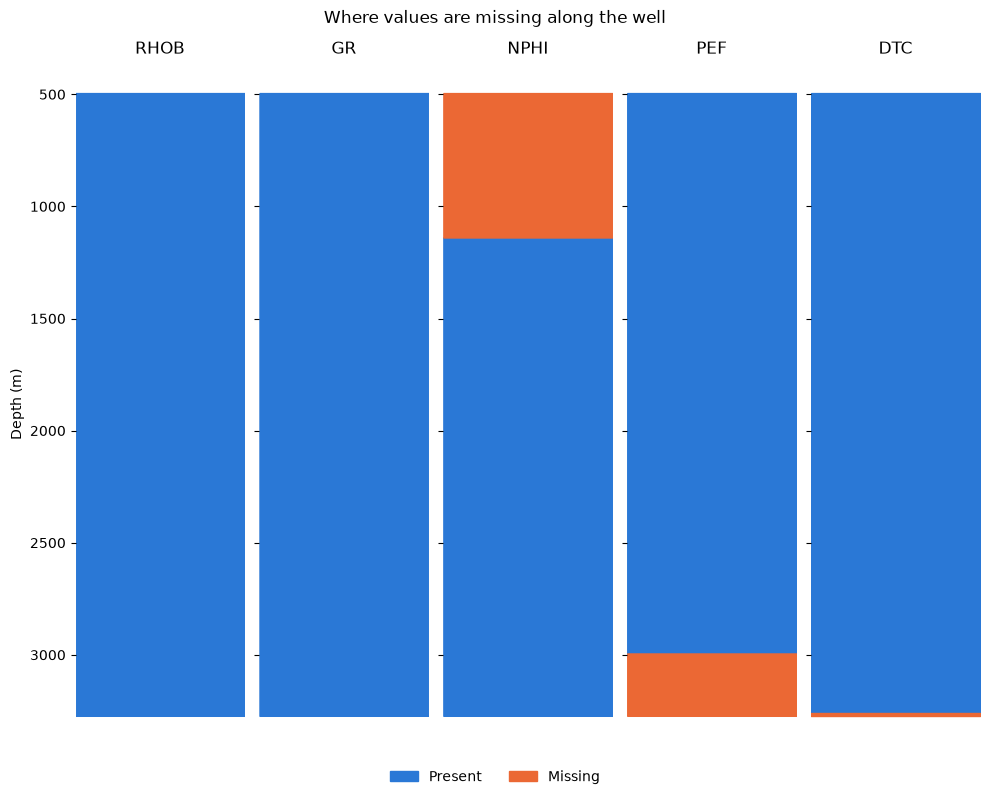

In [93]:
from matplotlib.patches import Patch

curves = ["RHOB", "GR", "NPHI", "PEF", "DTC"]

for col in curves:
    is_missing = df[col].isna()
    blocks = (is_missing != is_missing.shift()).cumsum()[is_missing].nunique()
    if is_missing.any():
        gap_depths = df.loc[is_missing, "DEPTH_MD"]
        print(f"{col}: {is_missing.sum()} missing, {blocks} block(s), from {gap_depths.min():.1f} to {gap_depths.max():.1f} m")
    else:
        print(f"{col}: no missing values")

fig, axes = plt.subplots(1, len(curves), figsize=(10, 8), sharey=True)
for ax, col in zip(axes, curves):
    present = df[col].notna()
    ax.fill_betweenx(df["DEPTH_MD"], 0, 1, where=present, color="#2a78d6", step="mid")
    ax.fill_betweenx(df["DEPTH_MD"], 0, 1, where=~present, color="#eb6834", step="mid")
    ax.set_title(col)
    ax.set_xlim(0, 1)
    ax.set_xticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)
axes[0].set_ylabel("Depth (m)")
axes[0].invert_yaxis()
fig.suptitle("Where values are missing along the well")
fig.legend(handles=[Patch(color="#2a78d6", label="Present"), Patch(color="#eb6834", label="Missing")],
           loc="lower center", ncol=2, frameon=False)
plt.tight_layout(rect=[0, 0.04, 1, 1])
plt.show()


The reason for the missing NPHI in the beginning is due to the fact that these tools are epensive to use, and if used incorrectly due to it being unsatble at the top of the well then there will be extra costs and it being lost forever in shallow depths is extremely high. PEF tool are located higher up in the long tool string so teh physical limitation of the tool, and the tool cannot go any deeper down to scan for types of rocks in the well. the reason for the dtc is not working is beacause of the equipment itself since the dtc equipment is very long the sensors are not at the end of the equipment but rather a bit higher, hency why it cannot get to the complete bottom of the well.


           Q1       Q3     IQR  lower_limit  upper_limit  below  above
curve                                                                 
RHOB    1.963    2.382   0.419        1.336        3.010      0      0
GR     43.867   81.543  37.676      -12.647      138.057      0    135
NPHI    0.315    0.506   0.191        0.029        0.793      2      1
PEF     2.321    4.267   1.947       -0.599        7.187      0    696
DTC    90.883  148.048  57.165        5.135      233.796      0      0


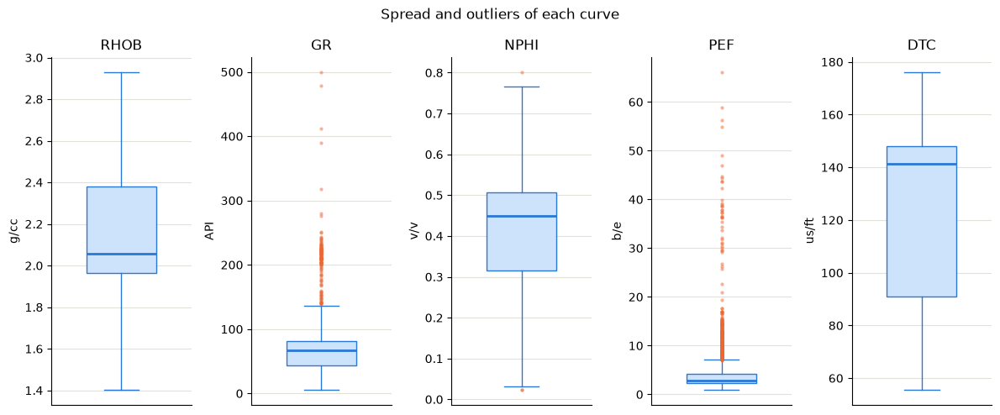

In [94]:
units = {"RHOB": "g/cc", "GR": "API", "NPHI": "v/v", "PEF": "b/e", "DTC": "us/ft"}

rows = []
for col in curves:
    values = df[col].dropna()
    q1, q3 = values.quantile([0.25, 0.75])
    iqr = q3 - q1
    lower, upper = q1 - 1.5 * iqr, q3 + 1.5 * iqr
    rows.append({"curve": col, "Q1": q1, "Q3": q3, "IQR": iqr, "lower_limit": lower, "upper_limit": upper,
                 "below": (values < lower).sum(), "above": (values > upper).sum()})
iqr_table = pd.DataFrame(rows).set_index("curve").round(3)
print(iqr_table)

fig, axes = plt.subplots(1, len(curves), figsize=(12, 5))
for ax, col in zip(axes, curves):
    ax.boxplot(df[col].dropna(), widths=0.5, patch_artist=True,
               boxprops=dict(facecolor="#cde2fb", edgecolor="#2a78d6"),
               medianprops=dict(color="#2a78d6", linewidth=2),
               whiskerprops=dict(color="#2a78d6"), capprops=dict(color="#2a78d6"),
               flierprops=dict(marker="o", markersize=3, markerfacecolor="#eb6834", markeredgecolor="none", alpha=0.5))
    ax.set_title(col)
    ax.set_ylabel(units[col])
    ax.set_xticks([])
    ax.spines[["top", "right"]].set_visible(False)
    ax.grid(axis="y", color="#e1e0d9")
    ax.set_axisbelow(True)
fig.suptitle("Spread and outliers of each curve")
plt.tight_layout()
plt.show()


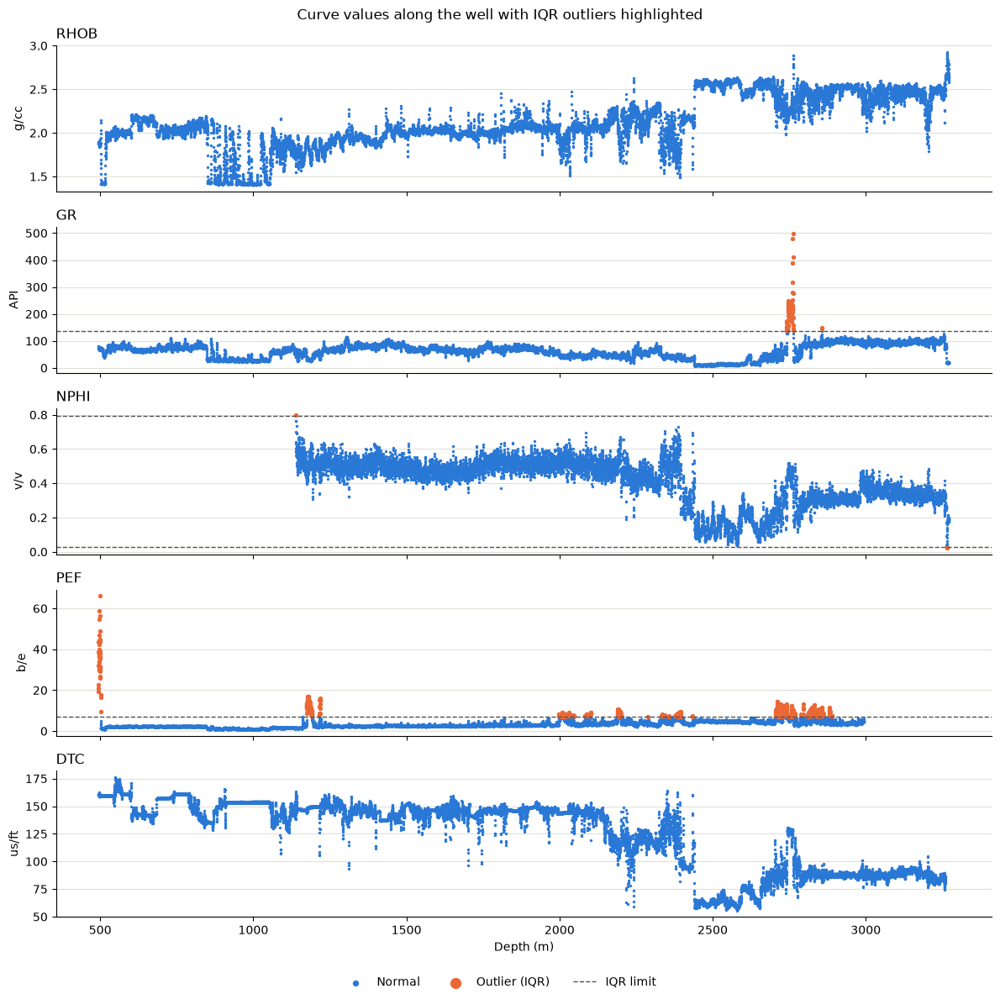

In [95]:
fig, axes = plt.subplots(len(curves), 1, figsize=(12, 12), sharex=True)
for ax, col in zip(axes, curves):
    lower = iqr_table.loc[col, "lower_limit"]
    upper = iqr_table.loc[col, "upper_limit"]
    is_outlier = (df[col] < lower) | (df[col] > upper)
    ax.scatter(df.loc[~is_outlier, "DEPTH_MD"], df.loc[~is_outlier, col], s=2, color="#2a78d6", label="Normal")
    ax.scatter(df.loc[is_outlier, "DEPTH_MD"], df.loc[is_outlier, col], s=8, color="#eb6834", label="Outlier (IQR)")
    for limit in [lower, upper]:
        if df[col].min() < limit < df[col].max():
            ax.axhline(limit, color="#52514e", linewidth=1, linestyle="--", label="IQR limit")
    ax.set_title(col, loc="left")
    ax.set_ylabel(units[col])
    ax.spines[["top", "right"]].set_visible(False)
    ax.grid(axis="y", color="#e1e0d9")
    ax.set_axisbelow(True)
axes[-1].set_xlabel("Depth (m)")
handles, labels = axes[1].get_legend_handles_labels()
fig.legend(handles, labels, loc="lower center", ncol=3, frameon=False, markerscale=3)
fig.suptitle("Curve values along the well with IQR outliers highlighted")
plt.tight_layout(rect=[0, 0.03, 1, 1])
plt.show()


Barite has an incredibly high atomic number, which causes the PEF tool to completely max out if there is a thick cake of drilling mud caked onto the well wall. for PEF The spike you see at 500 meters is the tool accidentally reading the heavy drilling mud instead of the actual rock. These points should be cleaned or removed.

For gamma ray the spike is just it detecting a highly radio active layer usually a hot shale, organic matter in this layer trapped radioactive elements like uranium, why this matters then is because this isnt really an outlier it shows These organic-rich shales are the source rocks that originally created the oil and gas in the area.

In [96]:
limits = {
    "RHOB": (1.5, 3.0),
    "GR": (0, 250),
    "NPHI": (-0.15, 1.0),
    "PEF": (0, 10),
    "DTC": (40, 190),
}

rows = []
for col, (low, high) in limits.items():
    values = df[col]
    below = values < low
    above = values > high
    flagged = below | above
    rows.append({
        "curve": col,
        "min_limit": low,
        "max_limit": high,
        "below": below.sum(),
        "above": above.sum(),
        "flagged": flagged.sum(),
        "percent": round(flagged.sum() / values.notna().sum() * 100, 2),
        "depth_from": df.loc[flagged, "DEPTH_MD"].min(),
        "depth_to": df.loc[flagged, "DEPTH_MD"].max(),
    })

physical_table = pd.DataFrame(rows).set_index("curve")
physical_table


,min_limit,max_limit,below,above,flagged,percent,depth_from,depth_to
curve,,,,,,,,
RHOB,1.50,3.0,976,0,976,5.34,502.736,2391.792
GR,0.00,250.0,0,9,9,0.05,2747.472,2762.368
NPHI,-0.15,1.0,0,0,0,0.00,NaN,NaN
PEF,0.00,10.0,0,225,225,1.37,494.528,2882.600
DTC,40.00,190.0,0,0,0,0.00,NaN,NaN


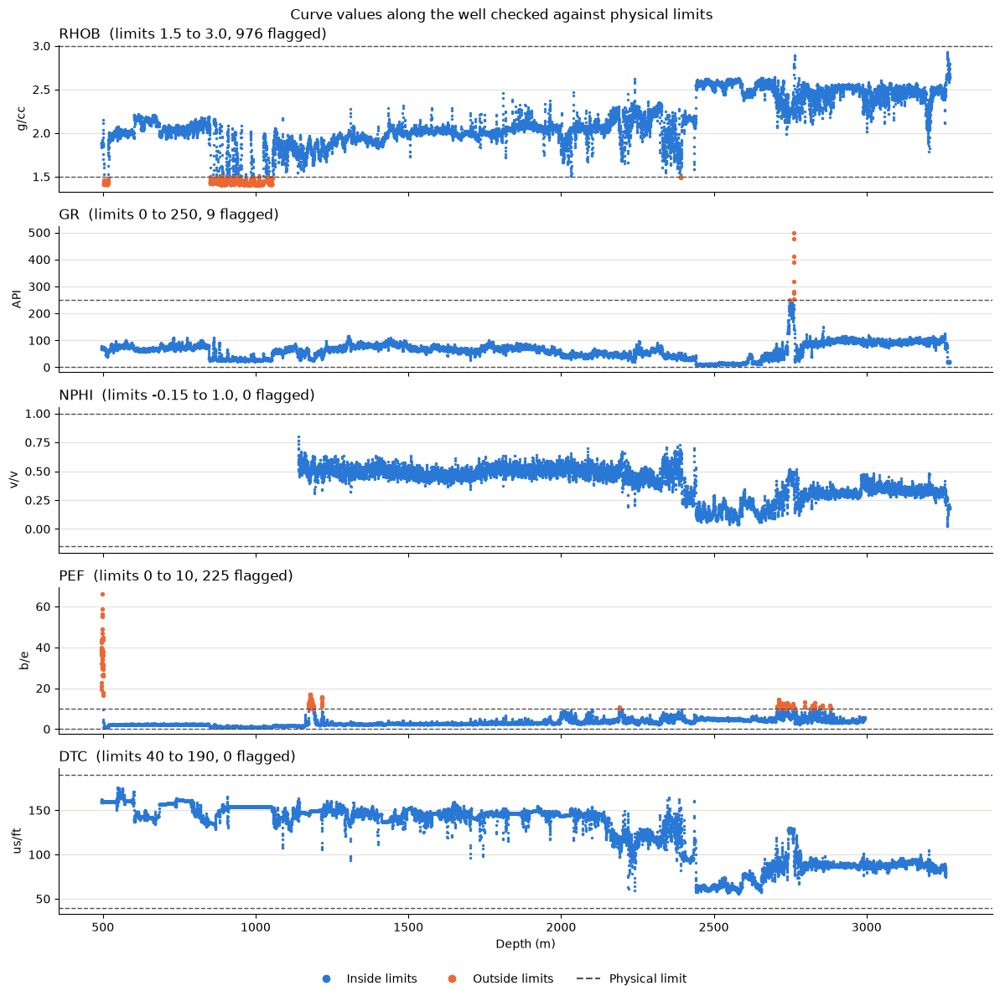

In [97]:
from matplotlib.lines import Line2D

fig, axes = plt.subplots(len(curves), 1, figsize=(12, 12), sharex=True)
for ax, col in zip(axes, curves):
    low, high = limits[col]
    is_flagged = (df[col] < low) | (df[col] > high)
    ax.scatter(df.loc[~is_flagged, "DEPTH_MD"], df.loc[~is_flagged, col], s=2, color="#2a78d6")
    ax.scatter(df.loc[is_flagged, "DEPTH_MD"], df.loc[is_flagged, col], s=8, color="#eb6834")
    ax.axhline(low, color="#52514e", linewidth=1, linestyle="--")
    ax.axhline(high, color="#52514e", linewidth=1, linestyle="--")
    ax.set_title(f"{col}  (limits {low} to {high}, {is_flagged.sum()} flagged)", loc="left")
    ax.set_ylabel(units[col])
    ax.spines[["top", "right"]].set_visible(False)
    ax.grid(axis="y", color="#e1e0d9")
    ax.set_axisbelow(True)
axes[-1].set_xlabel("Depth (m)")
legend_items = [
    Line2D([], [], marker="o", linestyle="", color="#2a78d6", label="Inside limits"),
    Line2D([], [], marker="o", linestyle="", color="#eb6834", label="Outside limits"),
    Line2D([], [], linestyle="--", color="#52514e", label="Physical limit"),
]
fig.legend(handles=legend_items, loc="lower center", ncol=3, frameon=False)
fig.suptitle("Curve values along the well checked against physical limits")
plt.tight_layout(rect=[0, 0.03, 1, 1])
plt.show()


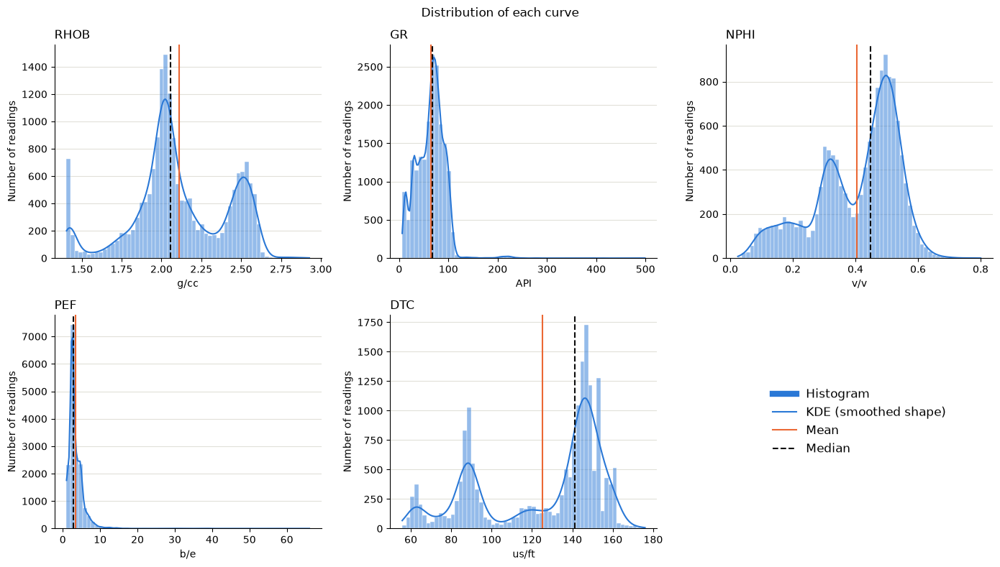

In [98]:
from matplotlib.lines import Line2D

fig, axes = plt.subplots(2, 3, figsize=(14, 8))
axes = axes.flatten()
for ax, col in zip(axes, curves):
    values = df[col].dropna()
    sns.histplot(values, bins=60, kde=True, color="#2a78d6", edgecolor="white", linewidth=0.3, ax=ax)
    ax.axvline(values.mean(), color="#eb6834", linewidth=1.5)
    ax.axvline(values.median(), color="#0b0b0b", linewidth=1.5, linestyle="--")
    ax.set_title(col, loc="left")
    ax.set_xlabel(units[col])
    ax.set_ylabel("Number of readings")
    ax.spines[["top", "right"]].set_visible(False)
    ax.grid(axis="y", color="#e1e0d9")
    ax.set_axisbelow(True)
axes[-1].axis("off")
axes[-1].legend(handles=[
    Line2D([], [], color="#2a78d6", linewidth=6, label="Histogram"),
    Line2D([], [], color="#2a78d6", linewidth=1.5, label="KDE (smoothed shape)"),
    Line2D([], [], color="#eb6834", linewidth=1.5, label="Mean"),
    Line2D([], [], color="#0b0b0b", linewidth=1.5, linestyle="--", label="Median"),
], loc="center", frameon=False, fontsize=12)
fig.suptitle("Distribution of each curve")
plt.tight_layout()
plt.show()


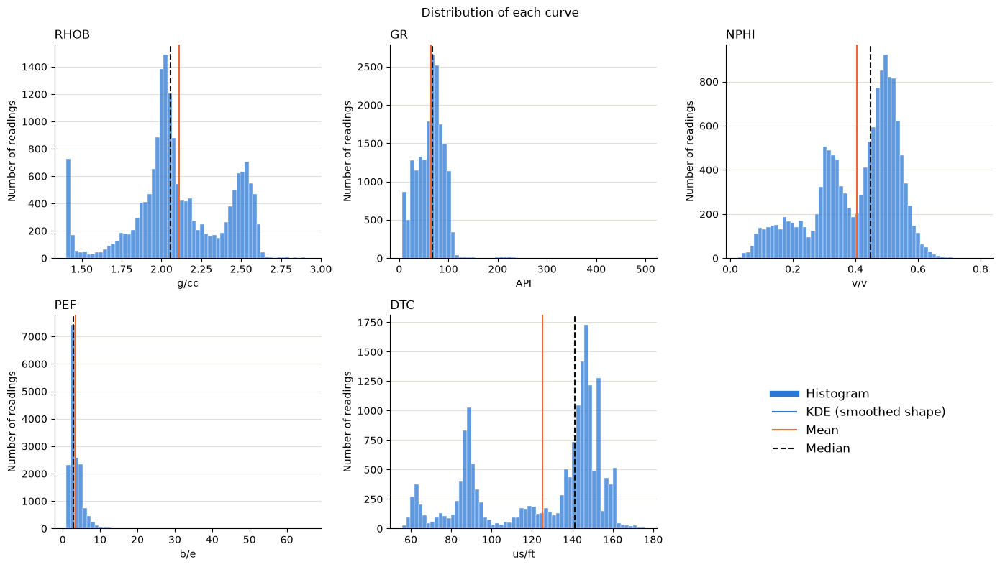

In [99]:
from matplotlib.lines import Line2D

fig, axes = plt.subplots(2, 3, figsize=(14, 8))
axes = axes.flatten()
for ax, col in zip(axes, curves):
    values = df[col].dropna()
    sns.histplot(values, bins=60, kde=False, color="#2a78d6", edgecolor="white", linewidth=0.3, ax=ax)
    ax.axvline(values.mean(), color="#eb6834", linewidth=1.5)
    ax.axvline(values.median(), color="#0b0b0b", linewidth=1.5, linestyle="--")
    ax.set_title(col, loc="left")
    ax.set_xlabel(units[col])
    ax.set_ylabel("Number of readings")
    ax.spines[["top", "right"]].set_visible(False)
    ax.grid(axis="y", color="#e1e0d9")
    ax.set_axisbelow(True)
axes[-1].axis("off")
axes[-1].legend(handles=[
    Line2D([], [], color="#2a78d6", linewidth=6, label="Histogram"),
    Line2D([], [], color="#2a78d6", linewidth=1.5, label="KDE (smoothed shape)"),
    Line2D([], [], color="#eb6834", linewidth=1.5, label="Mean"),
    Line2D([], [], color="#0b0b0b", linewidth=1.5, linestyle="--", label="Median"),
], loc="center", frameon=False, fontsize=12)
fig.suptitle("Distribution of each curve")
plt.tight_layout()
plt.show()


RHOB (density)
Two main bumps: soft rock and hard rock. A thin spike at the far left is bad data. skewed left

GR (radioactivity)
One main bump: the well is mostly shale. A small bump on the left is clean rock, and a long flat tail comes from a few spikes. skewed right

NPHI (porosity)
Two bumps: shale (right) and harder rock (left). skewed left

PEF (mineral type)
One tall spike: mostly the same kind of rock. The long flat tail is bad readings. skewed right

DTC (sound speed) 
Three bumps: soft, hard and very hard rock. skewed left

The RHOB spike is bad data because it's too light for rock, stuck at one value, found in one zone, and matched by bad PEF readings, which all points to the tool measuring mud in a washed-out hole.

if you look at the otehr data in the same ranges and starting point it also shows that the data is bad in the begining.

In [100]:
shape_table = pd.DataFrame({
    "mean": df[curves].mean(),
    "median": df[curves].median(),
    "skew": df[curves].skew(),
    "kurtosis": df[curves].kurt(),
}).round(3)

shape_table["skew_direction"] = np.where(shape_table["skew"] > 0.5, "right",
                                np.where(shape_table["skew"] < -0.5, "left", "roughly balanced"))
shape_table


,mean,median,skew,kurtosis,skew_direction
RHOB,2.110,2.055,-0.199,-0.189,roughly balanced
GR,63.847,66.778,1.212,11.302,right
NPHI,0.405,0.449,-0.717,-0.322,left
PEF,3.464,2.790,8.160,123.601,right
DTC,125.106,141.300,-0.702,-0.983,left


**kurtosis explains how extreme the oitleirs are measures how far the most extreme value sits from the average**

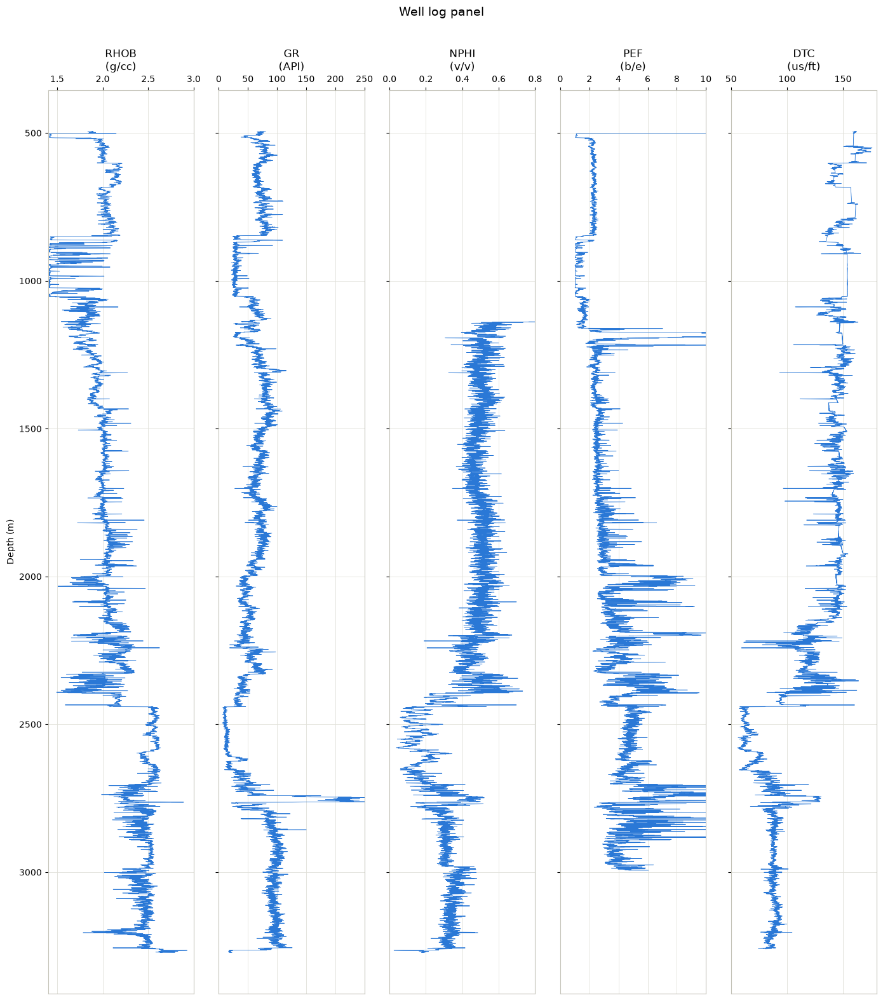

In [101]:
track_range = {"RHOB": (1.4, 3.0), "GR": (0, 250), "NPHI": (0, 0.8), "PEF": (0, 10), "DTC": (50, 180)}

fig, axes = plt.subplots(1, len(curves), figsize=(14, 16), sharey=True)
for ax, col in zip(axes, curves):
    ax.plot(df[col], df["DEPTH_MD"], color="#2a78d6", linewidth=0.6)
    ax.set_xlim(track_range[col])
    ax.set_title(f"{col}\n({units[col]})")
    ax.xaxis.tick_top()
    ax.grid(color="#e1e0d9", linewidth=0.6)
    ax.set_axisbelow(True)
    for spine in ax.spines.values():
        spine.set_color("#c3c2b7")
axes[0].set_ylabel("Depth (m)")
axes[0].invert_yaxis()
fig.suptitle("Well log panel", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


**Natural Geology view of graphs** this is how geologists see graphs when it comes to depths.

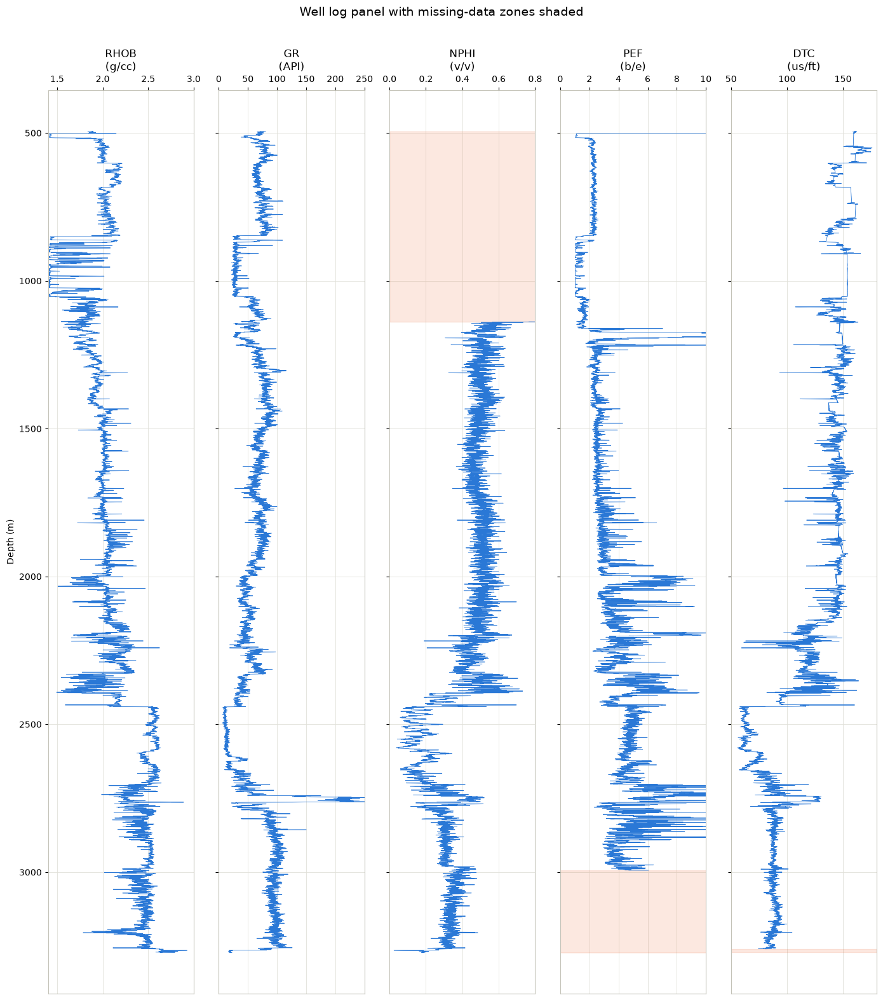

In [102]:
fig, axes = plt.subplots(1, len(curves), figsize=(14, 16), sharey=True)
for ax, col in zip(axes, curves):
    ax.plot(df[col], df["DEPTH_MD"], color="#2a78d6", linewidth=0.6)
    is_missing = df[col].isna()
    ax.fill_betweenx(df["DEPTH_MD"], track_range[col][0], track_range[col][1],
                      where=is_missing, color="#eb6834", alpha=0.15, step="mid")
    ax.set_xlim(track_range[col])
    ax.set_title(f"{col}\n({units[col]})")
    ax.xaxis.tick_top()
    ax.grid(color="#e1e0d9", linewidth=0.6)
    ax.set_axisbelow(True)
    for spine in ax.spines.values():
        spine.set_color("#c3c2b7")
axes[0].set_ylabel("Depth (m)")
axes[0].invert_yaxis()
fig.suptitle("Well log panel with missing-data zones shaded", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


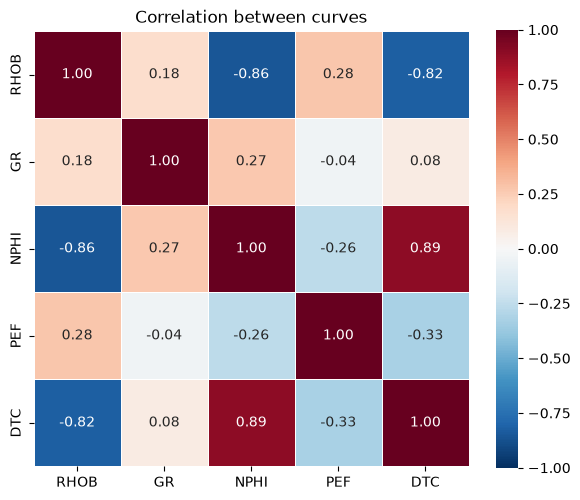

,RHOB,GR,NPHI,PEF,DTC
RHOB,1.000000,0.176968,-0.856195,0.280469,-0.824429
GR,0.176968,1.000000,0.270694,-0.042698,0.081199
NPHI,-0.856195,0.270694,1.000000,-0.259631,0.892950
PEF,0.280469,-0.042698,-0.259631,1.000000,-0.325901
DTC,-0.824429,0.081199,0.892950,-0.325901,1.000000


In [103]:
corr = df[curves].corr()

fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="RdBu_r", vmin=-1, vmax=1,
            square=True, linewidths=0.5, linecolor="white", ax=ax)
ax.set_title("Correlation between curves")
plt.tight_layout()
plt.show()

corr


* RHOB and NPHI having a negative correlation is normal, rock density goes up, porosity goes down less holes for water to get in meaning more density.
* RHOB and DTC negative because a more compact rock transmits sound faster which means lower dtc.
* NPHI and DTC is positive because the higher the more space means means slower sound which means higehr dtc and also the higehr the porosity.



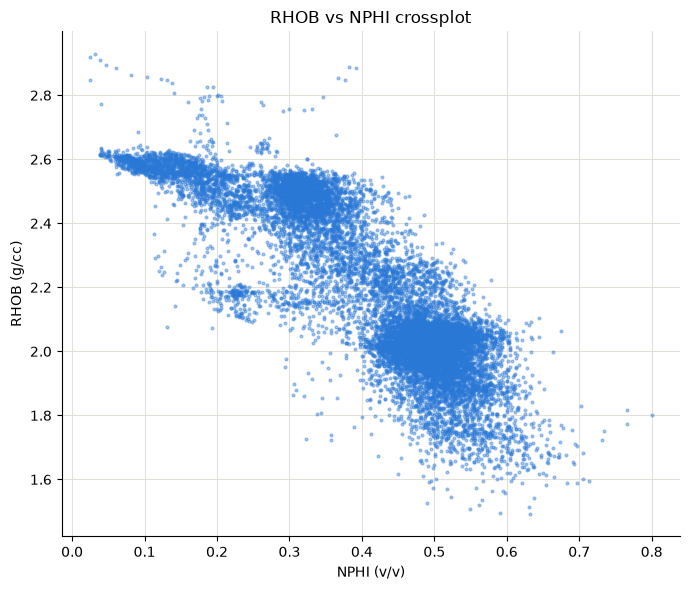

Correlation between RHOB and NPHI: -0.86


In [104]:
fig, ax = plt.subplots(figsize=(7, 6))
ax.scatter(df["NPHI"], df["RHOB"], s=4, alpha=0.4, color="#2a78d6")
ax.set_xlabel("NPHI (v/v)")
ax.set_ylabel("RHOB (g/cc)")
ax.set_title("RHOB vs NPHI crossplot")
ax.spines[["top", "right"]].set_visible(False)
ax.grid(color="#e1e0d9")
ax.set_axisbelow(True)
plt.tight_layout()
plt.show()
rhobh_nphi_corr = df[["RHOB", "NPHI"]].corr().iloc[0, 1]
print(f"Correlation between RHOB and NPHI: {rhobh_nphi_corr:.2f}")

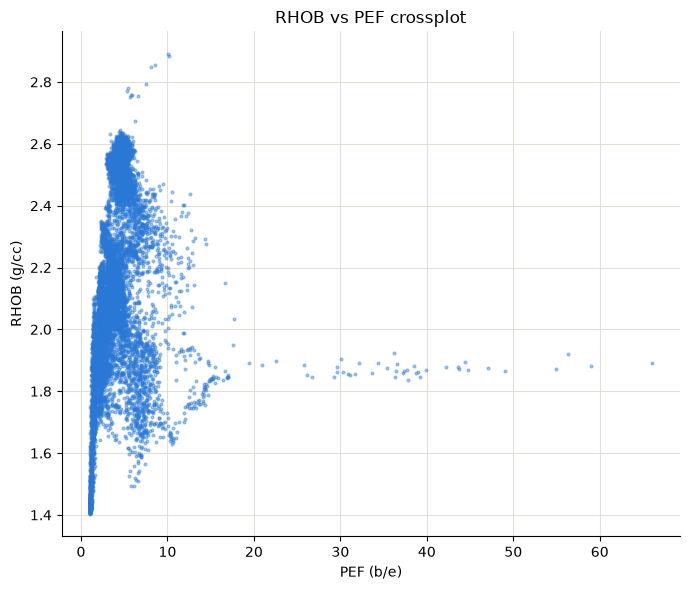

Correlation between PEF and RHOB: 0.28


In [105]:
fig, ax = plt.subplots(figsize=(7, 6))
sc = ax.scatter(df["PEF"], df["RHOB"], s= 4, alpha=0.4, color="#2a78d6")
ax.set_xlabel("PEF (b/e)")
ax.set_ylabel("RHOB (g/cc)")
ax.set_title("RHOB vs PEF crossplot")
ax.spines[["top", "right"]].set_visible(False)
ax.grid(color="#e1e0d9")
ax.set_axisbelow(True)
plt.tight_layout()
plt.show()
pef_rhob_corr = df[["PEF", "RHOB"]].corr().iloc[0, 1]
print(f"Correlation between PEF and RHOB: {pef_rhob_corr:.2f}")

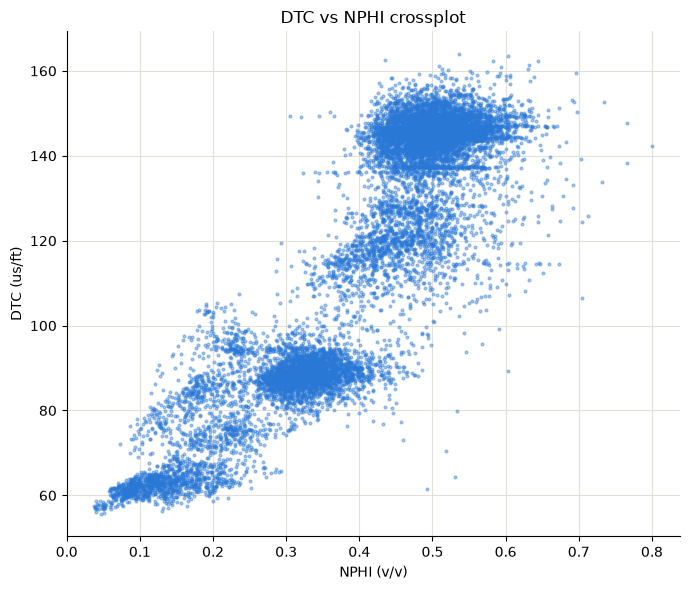

Correlation between NPHI and DTC: 0.89


In [106]:
fig, ax = plt.subplots(figsize=(7, 6))
sc = ax.scatter(df["NPHI"], df["DTC"], s=4, alpha=0.4, color="#2a78d6")
ax.set_xlabel("NPHI (v/v)")
ax.set_ylabel("DTC (us/ft)")
ax.set_title("DTC vs NPHI crossplot")
ax.spines[["top", "right"]].set_visible(False)
ax.grid(color="#e1e0d9")
ax.set_axisbelow(True)
plt.tight_layout()
plt.show()  
nphi_dtc_corr = df[["NPHI", "DTC"]].corr().iloc[0, 1]
print(f"Correlation between NPHI and DTC: {nphi_dtc_corr:.2f}")     
                                             

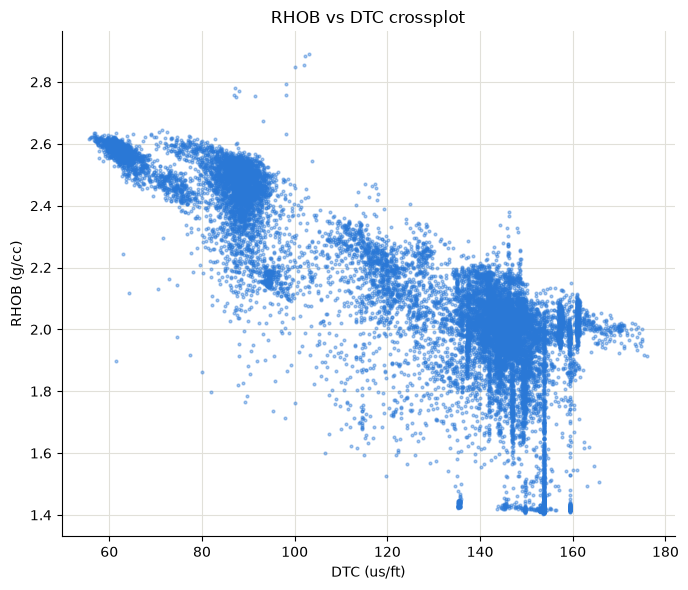

Correlation between DTC and RHOB: -0.82


In [107]:
fig, ax = plt.subplots(figsize=(7, 6))
sc = ax.scatter(df["DTC"], df["RHOB"], s=4, alpha=0.4, color="#2a78d6")
ax.set_xlabel("DTC (us/ft)")
ax.set_ylabel("RHOB (g/cc)")
ax.set_title("RHOB vs DTC crossplot")
ax.spines[["top", "right"]].set_visible(False)
ax.grid(color="#e1e0d9")
ax.set_axisbelow(True) 
plt.tight_layout()
plt.show()
dtc_rhob_corr = df[["DTC", "RHOB"]].corr().iloc[0, 1]
print(f"Correlation between DTC and RHOB: {dtc_rhob_corr:.2f}")

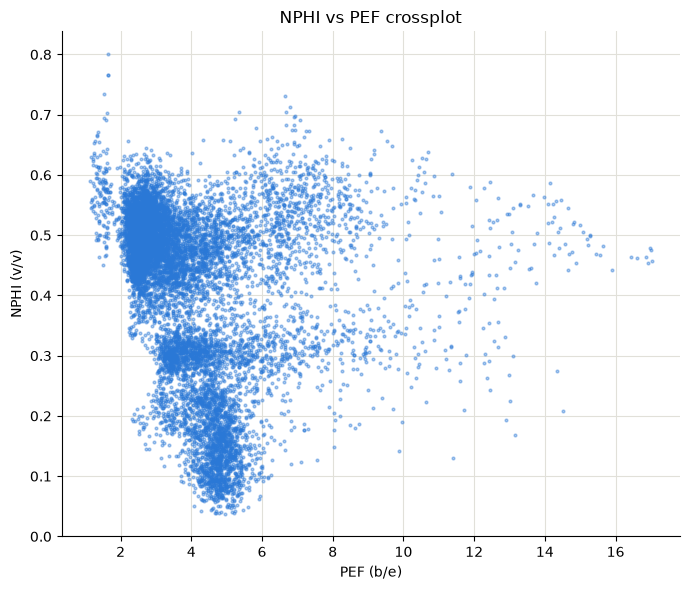

Correlation between PEF and NPHI:-0.26


In [108]:
fig, ax = plt.subplots(figsize=(7, 6))
sc = ax.scatter(df["PEF"], df["NPHI"], s=4, alpha=0.4, color="#2a78d6")
ax.set_xlabel("PEF (b/e)")
ax.set_ylabel("NPHI (v/v)")
ax.set_title("NPHI vs PEF crossplot")
ax.spines[["top", "right"]].set_visible(False)
ax.grid(color="#e1e0d9")
ax.set_axisbelow(True)
plt.tight_layout()
plt.show()
pef_nphi_corr = df[["PEF", "NPHI"]].corr().iloc[0, 1]
print(f"Correlation between PEF and NPHI:{pef_nphi_corr:.2f}")

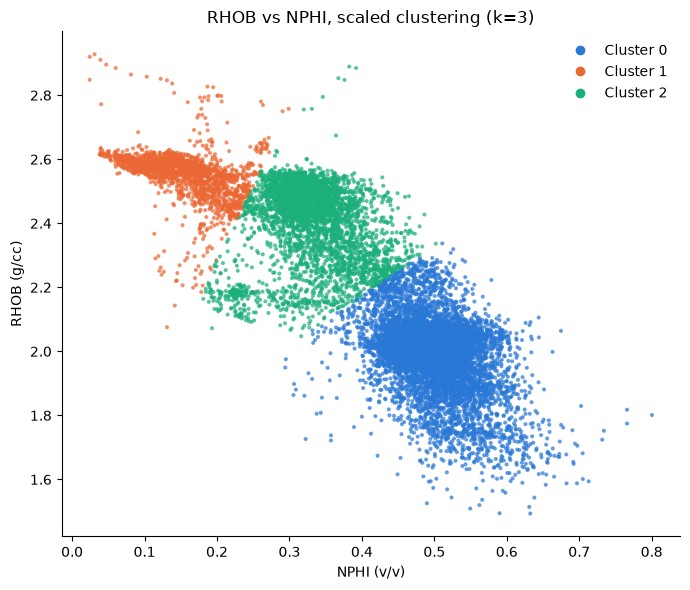

,RHOB,NPHI
cluster,,
0,1.990753,0.501342
1,2.551583,0.153728
2,2.407537,0.330861


In [109]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from matplotlib.lines import Line2D

rn_colors = {0: "#2a78d6", 1: "#eb6834", 2: "#1baf7a"}

cluster_data = df[["RHOB", "NPHI"]].dropna().copy()

scaler = StandardScaler()
scaled = scaler.fit_transform(cluster_data[["RHOB", "NPHI"]])

kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
cluster_data["cluster"] = kmeans.fit_predict(scaled)

fig, ax = plt.subplots(figsize=(7, 6))
ax.scatter(cluster_data["NPHI"], cluster_data["RHOB"],
           c=cluster_data["cluster"].map(rn_colors), s=4, alpha=0.6)
ax.set_xlabel("NPHI (v/v)")
ax.set_ylabel("RHOB (g/cc)")
ax.set_title("RHOB vs NPHI, scaled clustering (k=3)")
ax.legend(handles=[Line2D([], [], marker="o", linestyle="", color=c, label=f"Cluster {k}")
                   for k, c in rn_colors.items()], frameon=False)
ax.spines[["top", "right"]].set_visible(False)
plt.tight_layout()
plt.show()

cluster_data.groupby("cluster")[["RHOB", "NPHI"]].mean()


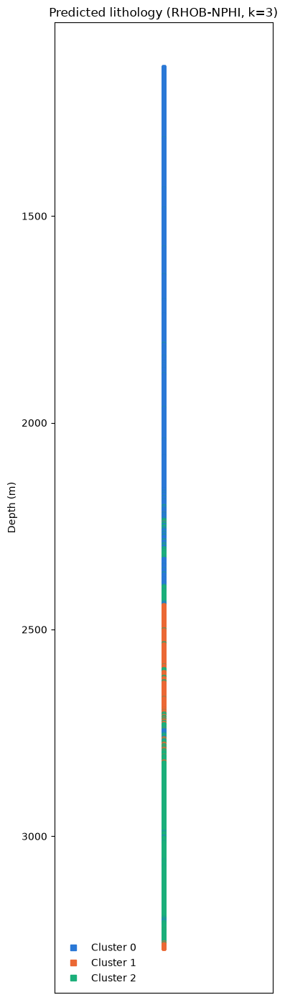

In [110]:
rn_colors = {0: "#2a78d6", 1: "#eb6834", 2: "#1baf7a"}

litho_rn = cluster_data["cluster"]

fig, ax = plt.subplots(figsize=(4, 14))
ax.scatter(np.ones(len(litho_rn)), df.loc[litho_rn.index, "DEPTH_MD"],
           c=litho_rn.map(rn_colors), s=6, marker="s")
ax.set_xticks([])
ax.set_ylabel("Depth (m)")
ax.set_title("Predicted lithology (RHOB-NPHI, k=3)")
ax.legend(handles=[Line2D([], [], marker="s", linestyle="", color=c, label=f"Cluster {k}")
                   for k, c in rn_colors.items()], frameon=False, loc="lower left")
ax.invert_yaxis()
plt.tight_layout()
plt.show()


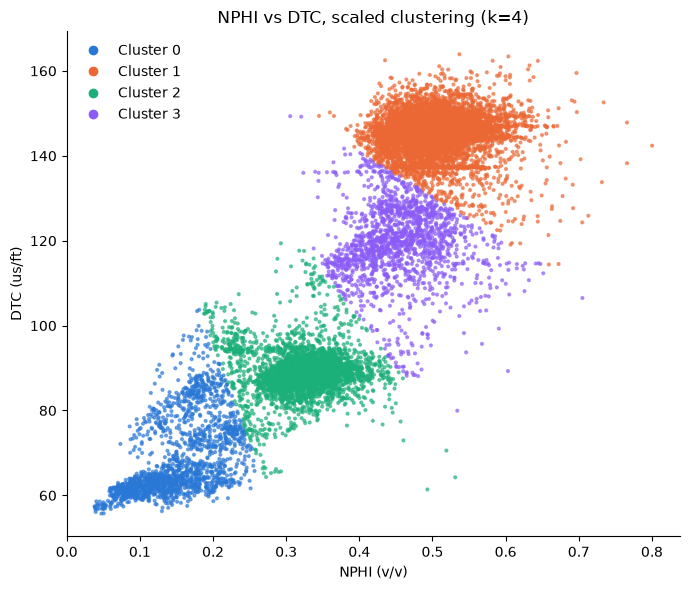

,RHOB,GR,NPHI,PEF,DTC
cluster,,,,,
0,2.541,21.139,0.150,4.776,68.912
1,1.975,65.854,0.508,3.266,145.272
2,2.420,85.455,0.322,4.838,88.942
3,2.130,66.043,0.455,4.470,119.351


In [111]:
nd_colors = {0: "#2a78d6", 1: "#eb6834", 2: "#1baf7a", 3: "#8b5cf6"}

cluster_data2 = df[["NPHI", "DTC"]].dropna().copy()

scaler2 = StandardScaler()
scaled2 = scaler2.fit_transform(cluster_data2[["NPHI", "DTC"]])

kmeans2 = KMeans(n_clusters=4, random_state=42, n_init=10)
cluster_data2["cluster"] = kmeans2.fit_predict(scaled2)

fig, ax = plt.subplots(figsize=(7, 6))
ax.scatter(cluster_data2["NPHI"], cluster_data2["DTC"],
           c=cluster_data2["cluster"].map(nd_colors), s=4, alpha=0.6)
ax.set_xlabel("NPHI (v/v)")
ax.set_ylabel("DTC (us/ft)")
ax.set_title("NPHI vs DTC, scaled clustering (k=4)")
ax.legend(handles=[Line2D([], [], marker="o", linestyle="", color=c, label=f"Cluster {k}")
                   for k, c in nd_colors.items()], frameon=False)
ax.spines[["top", "right"]].set_visible(False)
plt.tight_layout()
plt.show()

cluster_data2_full = df.loc[cluster_data2.index, curves].copy()
cluster_data2_full["cluster"] = cluster_data2["cluster"]
cluster_data2_full.groupby("cluster")[curves].mean().round(3)


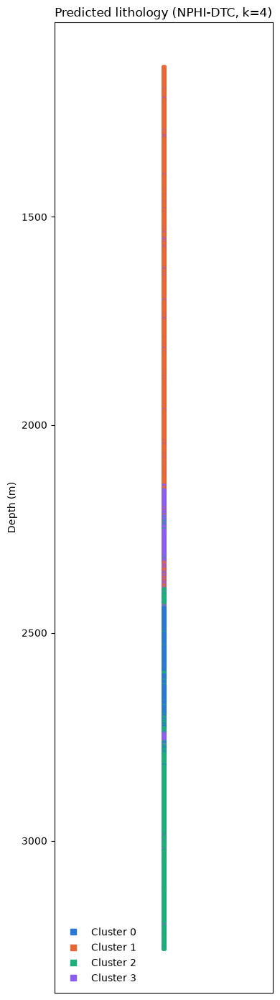

In [112]:
nd_colors = {0: "#2a78d6", 1: "#eb6834", 2: "#1baf7a", 3: "#8b5cf6"}

litho_nd = cluster_data2["cluster"]

fig, ax = plt.subplots(figsize=(4, 14))
ax.scatter(np.ones(len(litho_nd)), df.loc[litho_nd.index, "DEPTH_MD"],
           c=litho_nd.map(nd_colors), s=6, marker="s")
ax.set_xticks([])
ax.set_ylabel("Depth (m)")
ax.set_title("Predicted lithology (NPHI-DTC, k=4)")
ax.legend(handles=[Line2D([], [], marker="s", linestyle="", color=c, label=f"Cluster {k}")
                   for k, c in nd_colors.items()], frameon=False, loc="lower left")
ax.invert_yaxis()
plt.tight_layout()
plt.show()


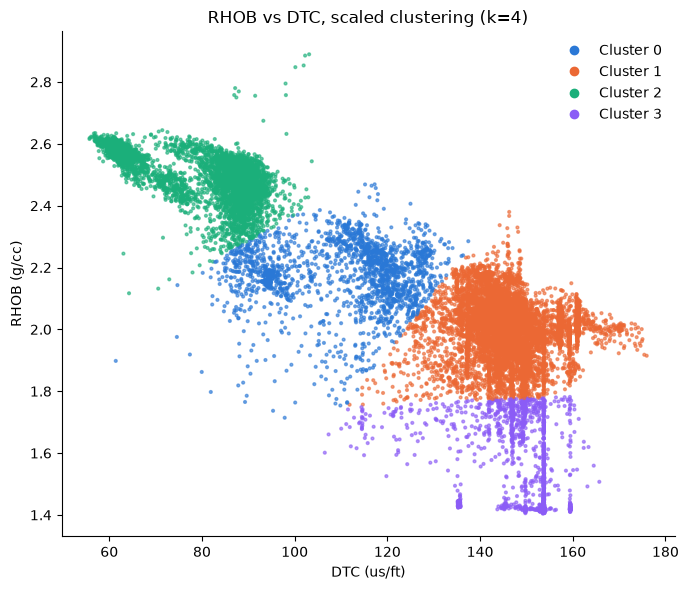

,RHOB,GR,NPHI,PEF,DTC
cluster,,,,,
0,2.176,64.239,0.405,4.636,110.569
1,2.002,67.770,0.502,3.022,146.503
2,2.494,66.442,0.264,4.747,81.021
3,1.549,38.093,0.563,2.236,149.472


In [113]:
rd_colors = {0: "#2a78d6", 1: "#eb6834", 2: "#1baf7a", 3: "#8b5cf6"}

cluster_data3 = df[["RHOB", "DTC"]].dropna().copy()

scaler3 = StandardScaler()
scaled3 = scaler3.fit_transform(cluster_data3[["RHOB", "DTC"]])

kmeans3 = KMeans(n_clusters=4, random_state=42, n_init=10)
cluster_data3["cluster"] = kmeans3.fit_predict(scaled3)

fig, ax = plt.subplots(figsize=(7, 6))
ax.scatter(cluster_data3["DTC"], cluster_data3["RHOB"],
           c=cluster_data3["cluster"].map(rd_colors), s=4, alpha=0.6)
ax.set_xlabel("DTC (us/ft)")
ax.set_ylabel("RHOB (g/cc)")
ax.set_title("RHOB vs DTC, scaled clustering (k=4)")
ax.legend(handles=[Line2D([], [], marker="o", linestyle="", color=c, label=f"Cluster {k}")
                   for k, c in rd_colors.items()], frameon=False)
ax.spines[["top", "right"]].set_visible(False)
plt.tight_layout()
plt.show()

cluster_data3_full = df.loc[cluster_data3.index, curves].copy()
cluster_data3_full["cluster"] = cluster_data3["cluster"]
cluster_data3_full.groupby("cluster")[curves].mean().round(3)


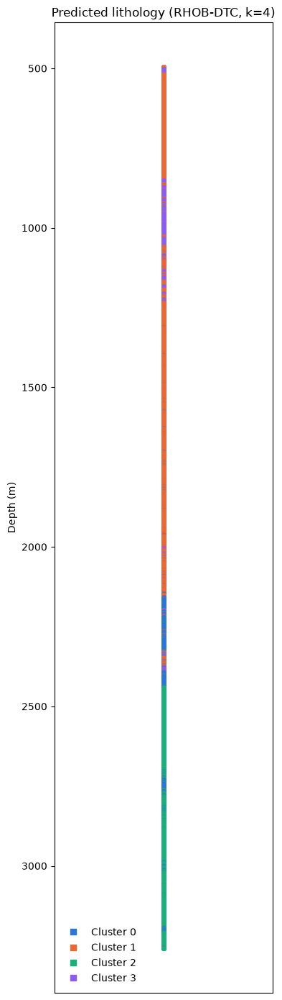

In [114]:
rd_colors = {0: "#2a78d6", 1: "#eb6834", 2: "#1baf7a", 3: "#8b5cf6"}

litho_rd = cluster_data3["cluster"]

fig, ax = plt.subplots(figsize=(4, 14))
ax.scatter(np.ones(len(litho_rd)), df.loc[litho_rd.index, "DEPTH_MD"],
           c=litho_rd.map(rd_colors), s=6, marker="s")
ax.set_xticks([])
ax.set_ylabel("Depth (m)")
ax.set_title("Predicted lithology (RHOB-DTC, k=4)")
ax.legend(handles=[Line2D([], [], marker="s", linestyle="", color=c, label=f"Cluster {k}")
                   for k, c in rd_colors.items()], frameon=False, loc="lower left")
ax.invert_yaxis()
plt.tight_layout()
plt.show()


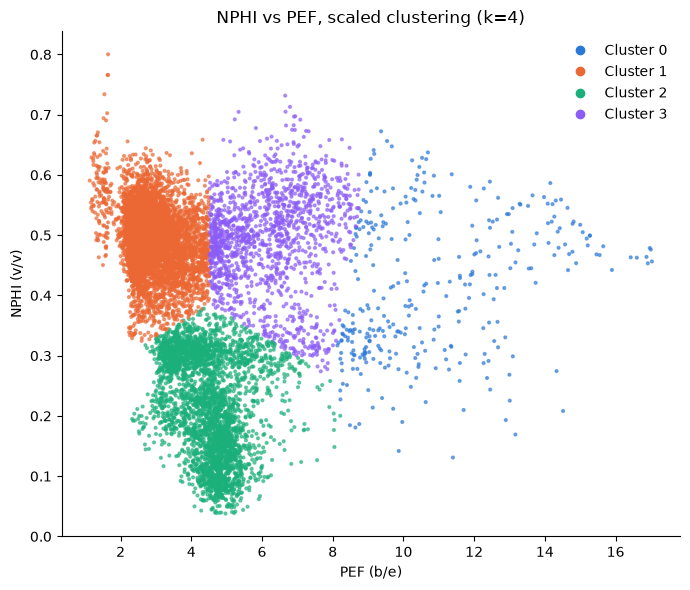

,RHOB,GR,NPHI,PEF,DTC
cluster,,,,,
0,2.048,59.707,0.416,10.826,117.060
1,2.020,67.165,0.492,2.851,141.282
2,2.486,47.762,0.218,4.513,78.619
3,2.019,64.228,0.493,6.179,125.062


In [115]:
np_colors = {0: "#2a78d6", 1: "#eb6834", 2: "#1baf7a", 3: "#8b5cf6"}

cluster_data4 = df[["NPHI", "PEF"]].dropna().copy()

scaler4 = StandardScaler()
scaled4 = scaler4.fit_transform(cluster_data4[["NPHI", "PEF"]])

kmeans4 = KMeans(n_clusters=4, random_state=42, n_init=10)
cluster_data4["cluster"] = kmeans4.fit_predict(scaled4)

fig, ax = plt.subplots(figsize=(7, 6))
ax.scatter(cluster_data4["PEF"], cluster_data4["NPHI"],
           c=cluster_data4["cluster"].map(np_colors), s=4, alpha=0.6)
ax.set_xlabel("PEF (b/e)")
ax.set_ylabel("NPHI (v/v)")
ax.set_title("NPHI vs PEF, scaled clustering (k=4)")
ax.legend(handles=[Line2D([], [], marker="o", linestyle="", color=c, label=f"Cluster {k}")
                   for k, c in np_colors.items()], frameon=False)
ax.spines[["top", "right"]].set_visible(False)
plt.tight_layout()
plt.show()

cluster_data4_full = df.loc[cluster_data4.index, curves].copy()
cluster_data4_full["cluster"] = cluster_data4["cluster"]
cluster_data4_full.groupby("cluster")[curves].mean().round(3)


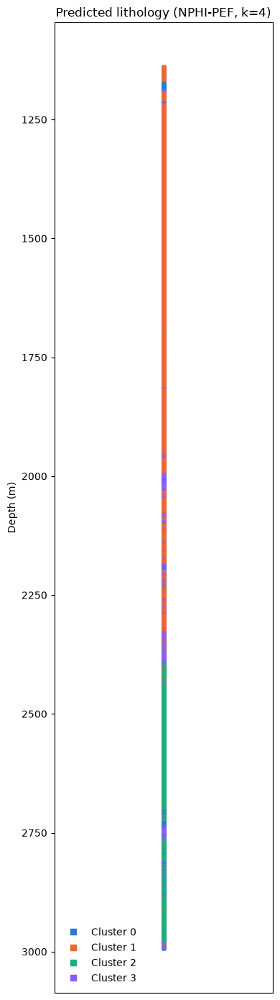

In [116]:
import matplotlib.pyplot as plt
import numpy as np
np_colors = {0: "#2a78d6", 1: "#eb6834", 2: "#1baf7a", 3: "#8b5cf6"}

litho_np = cluster_data4["cluster"]

fig, ax = plt.subplots(figsize=(4, 14))
ax.scatter(np.ones(len(litho_np)), df.loc[litho_np.index, "DEPTH_MD"],
           c=litho_np.map(np_colors), s=6, marker="s")
ax.set_xticks([])
ax.set_ylabel("Depth (m)")
ax.set_title("Predicted lithology (NPHI-PEF, k=4)")
ax.legend(handles=[Line2D([], [], marker="s", linestyle="", color=c, label=f"Cluster {k}")
                   for k, c in np_colors.items()], frameon=False, loc="lower left")
ax.invert_yaxis()
plt.tight_layout()
plt.show()


In [117]:
zone_order = ["Shallow", "Medium", "Deep", "Very deep"]
edges = df["DEPTH_MD"].quantile([0, 0.4, 0.6, 0.8, 1.0])
depth_zone = pd.cut(df["DEPTH_MD"], bins=edges, labels=zone_order, include_lowest=True).rename("zone")

zone_ranges = df.groupby(depth_zone, observed=True)["DEPTH_MD"].agg(["min", "max", "count"]).round(1)
print(zone_ranges)

stats = df[curves].groupby(depth_zone, observed=True).agg(["count", "mean", "median", "std", "min", "max"])
missing_pct = df[curves].isna().groupby(depth_zone, observed=True).mean() * 100
for col in curves:
    stats[(col, "missing_%")] = missing_pct[col]

zone_stats = stats[curves].T[zone_order].round(3)
zone_stats


              min     max  count
zone                            
Shallow     494.5  1605.2   7308
Medium     1605.3  2161.2   3654
Deep       2161.4  2716.6   3654
Very deep  2716.8  3272.0   3654


zone             Shallow    Medium      Deep  Very deep
RHOB count      7308.000  3654.000  3654.000   3654.000
     mean          1.886     2.028     2.312      2.440
     median        1.959     2.033     2.329      2.468
     std           0.219     0.080     0.264      0.118
     min           1.405     1.509     1.493      1.785
     max           2.311     2.469     2.644      2.928
     missing_%     0.000     0.000     0.000      0.000
GR   count      7308.000  3654.000  3654.000   3654.000
     mean         64.174    62.183    34.223     94.484
     median       69.141    63.421    35.717     94.843
     std          20.169    12.791    18.709     30.888
     min          21.378    27.560     6.192     16.781
     max         115.508    99.972    97.705    499.023
     missing_%     0.000     0.000     0.000      0.000
NPHI count      3070.000  3654.000  3654.000   3654.000
     mean          0.503     0.503     0.302      0.326
     median        0.500     0.503     0.252      0.324
     std           0.048     0.043     0.163      0.058
     min           0.306     0.346     0.038      0.024
     max           0.800     0.697     0.732      0.520
     missing_%    57.991     0.000     0.000      0.000
PEF  count      7308.000  3654.000  3654.000   1824.000
     mean          2.495     3.350     4.710      5.079
     median        2.284     2.921     4.615      4.495
     std           3.151     1.237     1.233      1.929
     min           1.010     2.203     2.236      2.327
     max          66.030     9.250    14.514     13.093
     missing_%     0.000     0.000     0.000     50.082
DTC  count      7308.000  3654.000  3654.000   3573.000
     mean        148.695   144.418    93.022     89.920
     median      148.707   145.565    92.582     88.384
     std           8.328     5.732    26.501      8.273
     min          93.378    96.644    55.727     67.266
     max         175.953   159.329   163.911    130.453
     missing_%     0.000     0.000     0.000      2.217

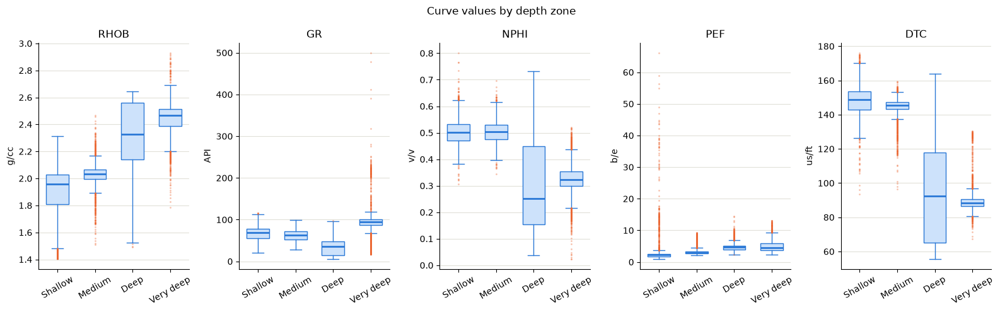

In [118]:
fig, axes = plt.subplots(1, len(curves), figsize=(16, 5))
for ax, col in zip(axes, curves):
    data = [df.loc[depth_zone == z, col].dropna() for z in zone_order]
    ax.boxplot(data, widths=0.6, patch_artist=True,
               boxprops=dict(facecolor="#cde2fb", edgecolor="#2a78d6"),
               medianprops=dict(color="#2a78d6", linewidth=2),
               whiskerprops=dict(color="#2a78d6"), capprops=dict(color="#2a78d6"),
               flierprops=dict(marker="o", markersize=2, markerfacecolor="#eb6834", markeredgecolor="none", alpha=0.4))
    ax.set_xticks(range(1, len(zone_order) + 1))
    ax.set_xticklabels(zone_order, rotation=30)
    ax.set_title(col)
    ax.set_ylabel(units[col])
    ax.spines[["top", "right"]].set_visible(False)
    ax.grid(axis="y", color="#e1e0d9")
    ax.set_axisbelow(True)
fig.suptitle("Curve values by depth zone")
plt.tight_layout()
plt.show()


### How to read the box plots

The well is split into four depth zones by percentage of depth: **Shallow** (0–40%, 494–1605 m), **Medium** (40–60%, 1605–2161 m), **Deep** (60–80%, 2161–2717 m) and **Very deep** (80–100%, 2717–3272 m). Each box summarises all readings of one curve inside one zone.

- **Box** – holds the middle 50% of readings, the typical values for that zone.
- **Line inside the box** – the median, the middle reading. Half the values are above it, half below.
- **Whiskers** – the range of readings that still count as normal.
- **Orange dots** – outliers, readings unusually far from the rest *of that zone*. Where there are many, they overlap and look like a thick line.

Reading left to right is like walking down the well.

### What the box plots show

- **Rock gets denser and faster with depth.** The RHOB median rises from 1.96 to 2.47 g/cc and DTC drops from 149 to 88 us/ft. Deeper rock is buried under more weight, so it is more compacted.
- **Shallow and Medium are almost the same rock.** NPHI (~0.50) and DTC (~146–149) barely change between them.
- **Deep is a mixed zone.** RHOB, NPHI and DTC have very tall boxes and almost no outliers, meaning the values vary a lot. This matches the clusters, which found more than one rock group at these depths.
- **Very deep is dense and radioactive.** GR has its highest median (~95 API), matching the dense high-GR cluster at the bottom of the well.



# PLOTLY CONVERSION

In [119]:
from pathlib import Path
chart_dir = Path("plotly_charts")
chart_dir.mkdir(exist_ok=True)

import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.stats import gaussian_kde

fig = go.Figure(go.Bar(
    x=missing_table.index, y=missing_table["percent"],
    marker_color="#2a78d6",
    text=[f"{p}%" if p > 0 else "" for p in missing_table["percent"]], textposition="outside",
    customdata=missing_table["missing"],
    hovertemplate="<b>%{x}</b><br>Missing: %{customdata:,} rows<br>%{y}% of readings<extra></extra>",
))
fig.update_layout(title="Missing values per column", yaxis_title="Missing (%)",
                  template="plotly_white", height=450)
fig.show()
fig.write_html(chart_dir / "01_missing_values.html", include_plotlyjs="cdn")

In [120]:
fig = make_subplots(rows=1, cols=len(curves), shared_yaxes=True, subplot_titles=curves, horizontal_spacing=0.02)

for i, col in enumerate(curves, start=1):
    is_missing = df[col].isna()
    blocks = df.groupby((is_missing != is_missing.shift()).cumsum())
    for _, block in blocks:
        missing = is_missing.loc[block.index[0]]
        start, end = block["DEPTH_MD"].min(), block["DEPTH_MD"].max()
        label = "Missing" if missing else "Present"
        fig.add_trace(go.Scatter(
            x=[0, 1, 1, 0, 0], y=[start, start, end, end, start], fill="toself", mode="lines",
            line=dict(width=0), fillcolor="#eb6834" if missing else "#2a78d6",
            hoveron="fills", name=f"{col} {label.lower()}: {start:.1f}–{end:.1f} m ({len(block):,} rows)",
            showlegend=False,
        ), row=1, col=i)

for label, color in [("Present", "#2a78d6"), ("Missing", "#eb6834")]:
    fig.add_trace(go.Scatter(x=[None], y=[None], mode="markers", name=label,
                             marker=dict(symbol="square", size=12, color=color)), row=1, col=1)

fig.update_xaxes(showticklabels=False, showgrid=False, zeroline=False, range=[0, 1])
fig.update_yaxes(autorange="reversed", showgrid=False)
fig.update_yaxes(title_text="Depth (m)", row=1, col=1)
fig.update_layout(title="Where values are missing along the well", template="plotly_white", height=800,
                  legend=dict(orientation="h", yanchor="top", y=-0.02, xanchor="center", x=0.5))
fig.show()
fig.write_html(chart_dir / "02_missing_along_well.html", include_plotlyjs="cdn")

In [121]:
fig = make_subplots(rows=1, cols=len(curves), subplot_titles=curves, horizontal_spacing=0.06)
for i, col in enumerate(curves, start=1):
    fig.add_trace(go.Box(
        y=df[col].dropna().to_numpy(), name=col, boxpoints="outliers",
        marker=dict(color="#eb6834", size=3, opacity=0.5),
        line=dict(color="#2a78d6"), fillcolor="#cde2fb", showlegend=False,
    ), row=1, col=i)
    fig.update_yaxes(title_text=units[col], row=1, col=i)
fig.update_xaxes(showticklabels=False)
fig.update_layout(title="Spread and outliers of each curve", template="plotly_white", height=500)
fig.show()
fig.write_html(chart_dir / "03_iqr_box_plots.html", include_plotlyjs="cdn")

In [122]:
fig = make_subplots(rows=len(curves), cols=1, shared_xaxes=True, subplot_titles=curves, vertical_spacing=0.03)
for i, col in enumerate(curves, start=1):
    lower, upper = iqr_table.loc[col, "lower_limit"], iqr_table.loc[col, "upper_limit"]
    is_outlier = (df[col] < lower) | (df[col] > upper)
    groups = [(df[col].notna() & ~is_outlier, "Normal", "#2a78d6", 3), (is_outlier, "Outlier (IQR)", "#eb6834", 5)]
    for mask, name, color, size in groups:
        fig.add_trace(go.Scattergl(
            x=df.loc[mask, "DEPTH_MD"].to_numpy(), y=df.loc[mask, col].to_numpy(), mode="markers",
            marker=dict(color=color, size=size), name=name, legendgroup=name, showlegend=False,
            hovertemplate=f"Depth: %{{x:.1f}} m<br>{col}: %{{y:.3f}} {units[col]}<extra>{name}</extra>",
        ), row=i, col=1)
    for limit in [lower, upper]:
        if df[col].min() < limit < df[col].max():
            fig.add_hline(y=limit, line=dict(color="#52514e", width=1, dash="dash"), row=i, col=1)
    fig.update_yaxes(title_text=units[col], row=i, col=1)

for name, color in [("Normal", "#2a78d6"), ("Outlier (IQR)", "#eb6834")]:
    fig.add_trace(go.Scatter(x=[None], y=[None], mode="markers", name=name, legendgroup=name,
                             marker=dict(color=color, size=8)), row=1, col=1)
fig.add_trace(go.Scatter(x=[None], y=[None], mode="lines", name="IQR limit",
                         line=dict(color="#52514e", width=1, dash="dash")), row=1, col=1)
fig.update_xaxes(title_text="Depth (m)", row=len(curves), col=1)
fig.update_layout(title="Curve values along the well with IQR outliers highlighted",
                  template="plotly_white", height=1100)
fig.show()
fig.write_html(chart_dir / "04_iqr_outliers_depth.html", include_plotlyjs="cdn")

In [123]:
titles = [f"{col}  (limits {low} to {high}, {((df[col] < low) | (df[col] > high)).sum()} flagged)"
          for col, (low, high) in limits.items()]
fig = make_subplots(rows=len(curves), cols=1, shared_xaxes=True, subplot_titles=titles, vertical_spacing=0.03)
for i, col in enumerate(curves, start=1):
    low, high = limits[col]
    is_flagged = (df[col] < low) | (df[col] > high)
    groups = [(df[col].notna() & ~is_flagged, "Inside limits", "#2a78d6", 3), (is_flagged, "Outside limits", "#eb6834", 5)]
    for mask, name, color, size in groups:
        fig.add_trace(go.Scattergl(
            x=df.loc[mask, "DEPTH_MD"].to_numpy(), y=df.loc[mask, col].to_numpy(), mode="markers",
            marker=dict(color=color, size=size), name=name, legendgroup=name, showlegend=(i == 1),
            hovertemplate=f"Depth: %{{x:.1f}} m<br>{col}: %{{y:.3f}} {units[col]}<extra>{name}</extra>",
        ), row=i, col=1)
    for limit in [low, high]:
        fig.add_hline(y=limit, line=dict(color="#52514e", width=1, dash="dash"), row=i, col=1)
    bottom, top = min(df[col].min(), low), max(df[col].max(), high)
    pad = (top - bottom) * 0.05
    fig.update_yaxes(title_text=units[col], range=[bottom - pad, top + pad], row=i, col=1)

fig.add_trace(go.Scatter(x=[None], y=[None], mode="lines", name="Physical limit",
                         line=dict(color="#52514e", width=1, dash="dash")), row=1, col=1)
fig.update_annotations(x=0, xanchor="left")
fig.update_xaxes(title_text="Depth (m)", row=len(curves), col=1)
fig.update_layout(title="Curve values along the well checked against physical limits",
                  template="plotly_white", height=1100)
fig.show()
fig.write_html(chart_dir / "05_physical_limits_depth.html", include_plotlyjs="cdn")

In [124]:
fig = make_subplots(rows=2, cols=3, subplot_titles=curves, horizontal_spacing=0.07, vertical_spacing=0.14)
for i, col in enumerate(curves):
    row, c = i // 3 + 1, i % 3 + 1
    values = df[col].dropna().to_numpy()
    counts, edges = np.histogram(values, bins=60)
    centers, width = (edges[:-1] + edges[1:]) / 2, edges[1] - edges[0]
    first = i == 0

    fig.add_trace(go.Bar(
        x=centers, y=counts, width=width, marker=dict(color="#2a78d6", line=dict(color="white", width=0.3)),
        name="Histogram", legendgroup="hist", showlegend=first,
        customdata=np.column_stack([edges[:-1], edges[1:]]),
        hovertemplate=f"{col}: %{{customdata[0]:.3f}}–%{{customdata[1]:.3f}} {units[col]}<br>Readings: %{{y:,}}<extra></extra>",
    ), row=row, col=c)

    grid = np.linspace(values.min(), values.max(), 400)
    kde = gaussian_kde(values)(grid) * len(values) * width
    fig.add_trace(go.Scatter(x=grid, y=kde, mode="lines", line=dict(color="#0d3f80", width=1.5),
                             name="KDE (smoothed shape)", legendgroup="kde", showlegend=first,
                             hoverinfo="skip"), row=row, col=c)

    top = counts.max() * 1.05
    for stat, value, color, dash in [("Mean", values.mean(), "#eb6834", "solid"), ("Median", np.median(values), "#0b0b0b", "dash")]:
        fig.add_trace(go.Scatter(x=[value, value], y=[0, top], mode="lines", line=dict(color=color, width=1.5, dash=dash),
                                 name=stat, legendgroup=stat, showlegend=first,
                                 hovertemplate=f"{stat}: {value:.3f} {units[col]}<extra></extra>"), row=row, col=c)

    fig.update_xaxes(title_text=units[col], row=row, col=c)
    fig.update_yaxes(title_text="Number of readings", row=row, col=c)

fig.update_xaxes(visible=False, row=2, col=3)
fig.update_yaxes(visible=False, row=2, col=3)
fig.update_layout(title="Distribution of each curve (click legend items to show/hide)", template="plotly_white",
                  height=750, bargap=0, legend=dict(x=0.72, y=0.3))
fig.show()
fig.write_html(chart_dir / "06_histograms.html", include_plotlyjs="cdn")

In [125]:
fig = make_subplots(rows=1, cols=len(curves), shared_yaxes=True, horizontal_spacing=0.02)
for i, col in enumerate(curves, start=1):
    low, high = track_range[col]
    is_missing = df[col].isna()
    for _, block in df[is_missing].groupby((is_missing != is_missing.shift()).cumsum()[is_missing]):
        start, end = block["DEPTH_MD"].min(), block["DEPTH_MD"].max()
        fig.add_trace(go.Scatter(
            x=[low, high, high, low, low], y=[start, start, end, end, start], fill="toself", mode="lines",
            line=dict(width=0), fillcolor="rgba(235, 104, 52, 0.15)", hoveron="fills",
            name="Missing data", legendgroup="missing", showlegend=False,
            text=f"{col} missing: {start:.1f}–{end:.1f} m",
        ), row=1, col=i)

    fig.add_trace(go.Scattergl(
        x=df[col].to_numpy(), y=df["DEPTH_MD"].to_numpy(), mode="lines", line=dict(color="#2a78d6", width=1),
        name=col, showlegend=False,
        hovertemplate=f"Depth: %{{y:.1f}} m<br>{col}: %{{x:.3f}} {units[col]}<extra></extra>",
    ), row=1, col=i)
    fig.update_xaxes(range=[low, high], side="top", title_text=f"{col} ({units[col]})", row=1, col=i)

fig.add_trace(go.Scatter(x=[None], y=[None], mode="markers", name="Missing data", legendgroup="missing",
                         marker=dict(symbol="square", size=12, color="rgba(235, 104, 52, 0.4)")), row=1, col=1)
fig.update_xaxes(showgrid=True, gridcolor="#e1e0d9")
fig.update_yaxes(autorange="reversed", gridcolor="#e1e0d9")
fig.update_yaxes(title_text="Depth (m)", row=1, col=1)
fig.update_layout(title=dict(text="Well log panel (drag on any track to zoom all tracks to that depth)", y=0.99),
                  template="plotly_white", height=1100, margin=dict(t=120),
                  legend=dict(orientation="h", yanchor="top", y=-0.01, xanchor="center", x=0.5))
fig.show()
fig.write_html(chart_dir / "07_log_panel.html", include_plotlyjs="cdn")

In [126]:
fig = go.Figure(go.Heatmap(
    z=corr.to_numpy(), x=corr.columns, y=corr.index, colorscale="RdBu_r", zmin=-1, zmax=1,
    text=corr.round(2).to_numpy(), texttemplate="%{text}", xgap=2, ygap=2,
    hovertemplate="%{y} vs %{x}<br>Correlation: %{z:.2f}<extra></extra>",
))
fig.update_yaxes(autorange="reversed")
fig.update_layout(title="Correlation between curves", template="plotly_white", width=600, height=550)
fig.show()
fig.write_html(chart_dir / "08_correlation_heatmap.html", include_plotlyjs="cdn")

In [127]:
pairs = [("NPHI", "RHOB"), ("PEF", "RHOB"), ("NPHI", "DTC"), ("DTC", "RHOB"), ("PEF", "NPHI")]

fig = go.Figure()
buttons = []
for n, (x_col, y_col) in enumerate(pairs):
    data = df[[x_col, y_col, "DEPTH_MD"]].dropna()
    fig.add_trace(go.Scattergl(
        x=data[x_col].to_numpy(), y=data[y_col].to_numpy(), customdata=data["DEPTH_MD"].to_numpy(),
        mode="markers", marker=dict(color="#2a78d6", size=4, opacity=0.4), visible=(n == 0), showlegend=False,
        hovertemplate=f"{x_col}: %{{x:.3f}} {units[x_col]}<br>{y_col}: %{{y:.3f}} {units[y_col]}<br>Depth: %{{customdata:.1f}} m<extra></extra>",
    ))
    title = f"{y_col} vs {x_col} crossplot (correlation {corr.loc[x_col, y_col]:.2f})"
    buttons.append(dict(label=f"{y_col} vs {x_col}", method="update", args=[
        {"visible": [k == n for k in range(len(pairs))]},
        {"title.text": title,
         "xaxis.title.text": f"{x_col} ({units[x_col]})", "yaxis.title.text": f"{y_col} ({units[y_col]})",
         "xaxis.autorange": True, "yaxis.autorange": True},
    ]))

x0, y0 = pairs[0]
fig.update_layout(
    title=f"{y0} vs {x0} crossplot (correlation {corr.loc[x0, y0]:.2f})",
    xaxis_title=f"{x0} ({units[x0]})", yaxis_title=f"{y0} ({units[y0]})",
    updatemenus=[dict(buttons=buttons, direction="down", x=1, xanchor="right", y=1.15, yanchor="top")],
    template="plotly_white", height=600,
)
fig.show()
fig.write_html(chart_dir / "09_crossplots.html", include_plotlyjs="cdn")

In [128]:
clusterings = [
    ("RHOB-NPHI", cluster_data, "NPHI", "RHOB", rn_colors),
    ("NPHI-DTC", cluster_data2, "NPHI", "DTC", nd_colors),
    ("RHOB-DTC", cluster_data3, "DTC", "RHOB", rd_colors),
    ("NPHI-PEF", cluster_data4, "PEF", "NPHI", np_colors),
]
half_step = df["DEPTH_MD"].diff().median() / 2
well_top, well_bottom = df["DEPTH_MD"].min(), df["DEPTH_MD"].max()

for pair_name, data, x_col, y_col, colors in clusterings:
    k = data["cluster"].nunique()
    depth = df.loc[data.index, "DEPTH_MD"]
    labels = data["cluster"].reindex(df.index)
    run_id = ((labels != labels.shift()) | labels.isna()).cumsum()
    runs = (pd.DataFrame({"cluster": labels, "depth": df["DEPTH_MD"], "run": run_id})
            .dropna(subset=["cluster"])
            .groupby("run").agg(cluster=("cluster", "first"), start=("depth", "min"), end=("depth", "max")))

    fig = make_subplots(rows=1, cols=2, column_widths=[0.75, 0.25], horizontal_spacing=0.08,
                        subplot_titles=[f"{y_col} vs {x_col}", "Down the well"])
    for cluster, color in colors.items():
        members = data[data["cluster"] == cluster]
        fig.add_trace(go.Scattergl(
            x=members[x_col].to_numpy(), y=members[y_col].to_numpy(), customdata=depth[members.index].to_numpy(),
            mode="markers", marker=dict(color=color, size=4, opacity=0.6),
            name=f"Cluster {cluster}", legendgroup=f"c{cluster}",
            hovertemplate=f"Cluster {cluster}<br>{x_col}: %{{x:.3f}}<br>{y_col}: %{{y:.3f}}<br>Depth: %{{customdata:.1f}} m<extra></extra>",
        ), row=1, col=1)

        bands = runs[runs["cluster"] == cluster]
        xs, ys = [], []
        for start, end in zip(bands["start"] - half_step, bands["end"] + half_step):
            xs += [0, 1, 1, 0, 0, None]
            ys += [start, start, end, end, start, None]
        fig.add_trace(go.Scatter(
            x=xs, y=ys, fill="toself", mode="lines", line=dict(width=0), fillcolor=color,
            hoveron="fills", name=f"Cluster {cluster}", legendgroup=f"c{cluster}", showlegend=False,
        ), row=1, col=2)

    fig.update_xaxes(title_text=f"{x_col} ({units[x_col]})", row=1, col=1)
    fig.update_yaxes(title_text=f"{y_col} ({units[y_col]})", row=1, col=1)
    fig.update_xaxes(visible=False, range=[-0.5, 1.5], row=1, col=2)
    fig.update_yaxes(title_text="Depth (m)", range=[well_bottom, well_top], showgrid=True, row=1, col=2)
    fig.update_layout(title=f"Predicted lithology: {pair_name} clustering (k={k}), click a cluster in the legend to hide/show it",
                      template="plotly_white", height=750)
    fig.show()
    fig.write_html(chart_dir / f"10_clusters_{pair_name}.html", include_plotlyjs="cdn")

In [129]:
zone_labels = depth_zone.astype(str)
fig = make_subplots(rows=1, cols=len(curves), subplot_titles=curves, horizontal_spacing=0.05)
for i, col in enumerate(curves, start=1):
    present = df[col].notna()
    fig.add_trace(go.Box(
        x=zone_labels[present].to_numpy(), y=df.loc[present, col].to_numpy(), boxpoints="outliers",
        marker=dict(color="#eb6834", size=2, opacity=0.4), line=dict(color="#2a78d6"), fillcolor="#cde2fb",
        name=col, showlegend=False,
    ), row=1, col=i)
    fig.update_yaxes(title_text=units[col], row=1, col=i)
fig.update_xaxes(categoryorder="array", categoryarray=zone_order, tickangle=-30)
fig.update_layout(title="Curve values by depth zone", template="plotly_white", height=550)
fig.show()
fig.write_html(chart_dir / "11_depth_zone_box_plots.html", include_plotlyjs="cdn")

# 8. Summary

## Dataset
- One well, **18,270 readings**, 6 columns: RHOB, GR, NPHI, PEF, DTC and DEPTH_MD. There is no lithology label, so rock types can only be estimated, not verified.
- Depth runs from **494.5 to 3272.0 m** in regular 0.152 m steps, always increasing, with no duplicate rows.
- **12,202 rows** (67%) have all five curves present.

## Key findings

**1. Data coverage**
| Curve | Missing | Where |
|---|---|---|
| NPHI | 4,238 (23.2%) | 494.5–1138.6 m (top of the well) |
| PEF | 1,830 (10.0%) | 2994.0–3272.0 m (bottom of the well) |
| DTC | 81 (0.4%) | 3259.9–3272.0 m (very bottom) |
| RHOB, GR | none | – |

Each gap is one continuous block, which fits how the tools work (see section 2 notes), not random dropouts.

**2. Distributions**
- RHOB has two peaks (soft and hard rock) plus a thin spike of bad data at the low end.
- DTC has three peaks (soft, hard and very hard rock).
- GR is right-skewed: the well is mostly shale, with a long tail from a few spikes.
- PEF is the most extreme curve (skew 8.2, kurtosis 123.6), driven by mud-related spikes.

**3. Relationships**
- Three strong, physically expected relationships: **NPHI–DTC +0.89**, **RHOB–NPHI −0.86**, **RHOB–DTC −0.82**. Density, porosity and sonic all respond to how compacted and porous the rock is.
- GR is only weakly related to every other curve (−0.04 to 0.27), so radioactivity carries information the other curves don't.

**4. Clustering (estimated lithology)**
- RHOB-NPHI (k=3) and NPHI-DTC (k=4) independently found the **same three rock groups**, with matching 5-curve averages even though GR, PEF and DTC weren't all used to build them:

| Group | RHOB | NPHI | DTC | GR | Depth (approx.) |
|---|---|---|---|---|---|
| Soft / porous | ~1.98 | ~0.50 | ~141–145 | ~65 | top of well to ~2150 m |
| Transition (NPHI-DTC only) | 2.13 | 0.46 | 119 | 66 | ~2150–2450 m |
| Dense / clean (low GR) | ~2.55 | ~0.15 | ~69 | ~22 | ~2450–2700 m |
| Dense / high GR | ~2.41 | ~0.33 | ~90 | ~85 | ~2750 m to bottom |

- RHOB-DTC shows the soft/porous group extends all the way to the top of the well. One of its clusters is the washout bad data (average RHOB 1.55, mostly ~850–1250 m).
- NPHI-PEF split off the high-PEF readings (average PEF 10.8) as their own cluster.
- Caution: without labels these groups are interpretations. Part of the split may reflect burial depth (compaction), not only rock type.

**5. Depth zones** (percentage-based intervals, not formation tops)
| Median | Shallow (494–1605 m) | Medium (1605–2161 m) | Deep (2161–2717 m) | Very deep (2717–3272 m) |
|---|---|---|---|---|
| RHOB (g/cc) | 1.96 | 2.03 | 2.33 | 2.47 |
| NPHI (v/v) | 0.500 | 0.503 | 0.252 | 0.324 |
| DTC (us/ft) | 148.7 | 145.6 | 92.6 | 88.4 |
| GR (API) | 69.1 | 63.4 | 35.7 | 94.8 |
| PEF (b/e) | 2.28 | 2.92 | 4.62 | 4.50 |

- Rock gets denser and faster with depth (compaction).
- Shallow and Medium are almost the same rock.
- Deep is a mixed zone (widest spread, more than one rock group).
- Very deep is dense with the highest GR.

